# [Dragon Curve](https://en.wikipedia.org/wiki/Dragon_curve) _(self-similar fractal curves)_
Here is a nice wiki animation that represents the recursive principle of dragon curve construction and my implementation below.

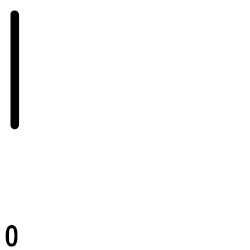

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

In [2]:
class DragonSequenceGenerator:
    def __init__(self):
        pass
    
    def generate(self, stage=8):
        array = np.array([[0,0],[1,0]])
        for _ in range(stage):
            second_array = self.rotate_sequence(array[:-1], array[-1])[::-1]
            array = np.concatenate((array, second_array), axis=0)
        return array
    
    def rotate_sequence(self, sequence, center):
        return np.array(list(map(lambda point: self.rotate_point(point, center), sequence)))
    
    @staticmethod
    def rotate_point(point, center):
        # rotate point clockwise for 90 degrees from center
        X = point[1] - center[1] + center[0]
        Y = center[1] - point[0] + center[0]
        return np.array([X, Y])

In [3]:
class Ploter:
    def __init__(self, image_width=16):
        self.image_width = image_width
        
    def get_figure(self, sequence, show=False):
        figure, axis = self.init_layout(sequence)
        for i in range(len(sequence)-1):
            axis.plot(sequence[i:i+2,0], sequence[i:i+2,1], color='black')
        if show:
            plt.show()
        else:
            plt.close(figure)
        return figure
        
    def init_layout(self, sequence):
        min_X = min(sequence[:,0])
        max_X = max(sequence[:,0])
        min_Y = min(sequence[:,1])
        max_Y = max(sequence[:,1])
        width, height = self.__get_picture_size(min_X, max_X, min_Y, max_Y)

        figure, axis = plt.subplots(figsize=(width, height))
        axis.set_axis_off()
        plt.xlim(min_X-1, max_X+1)
        plt.ylim(min_Y-1, max_Y+1)
        return figure, axis

    def __get_picture_size(self, min_X, max_X, min_Y, max_Y):
        pixel_width, pixel_height = abs(min_X) + abs(max_X), abs(min_Y) + abs(max_Y)
        return np.array([pixel_width, pixel_height]) / pixel_width * self.image_width

In [4]:
generator = DragonSequenceGenerator()
ploter = Ploter()

# Dragon ploting

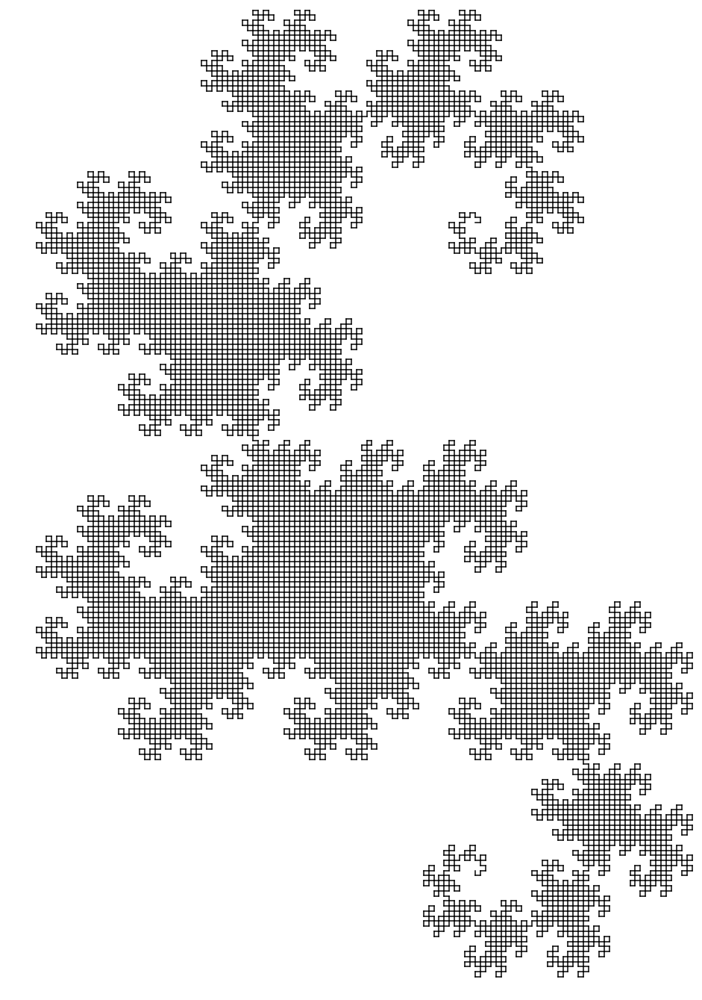

In [5]:
array = generator.generate(14)
figure = ploter.get_figure(array, show=True)
figure.savefig('dragon_curve.png', dpi=200, bbox='tight')

# Dragon animation

In [6]:
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['animation.embed_limit'] = 2**28

In [7]:
class Animator:
    def __init__(self, ploter, n_frames = 100):
        self.ploter = ploter
        self.n_frames = n_frames
        self.sequence = None
        self.len_seq = None
        self.__step = None
        self.figure = None
        self.line = None
        
    @property
    def step(self):
        if self.__step is not None:
            return self.__step
        self.__step = self.len_seq // self.n_frames + 2
        return self.__step
    
    # set up the figure, the axis, and the plot element we want to animate
    def init_layout(self, sequence):
        self.sequence = sequence
        self.len_seq = len(sequence)
        self.figure, axis = self.ploter.init_layout(sequence)
        self.line, = axis.plot([], [], lw=2)
        plt.close(self.figure)
        
    # initialization function: plot the background of each frame
    def init_frame(self):
        self.line.set_data([], [])
        return (self.line,)
    
    # animation function. This is called sequentially
    def animate(self, i):
        self.line.set_data(self.sequence[:i * self.step, 0], self.sequence[: i * self.step, 1])
        return (self.line, )

In [8]:
animator = Animator(ploter)
animator.init_layout(generator.generate(13))

In [9]:
anim_dragon = animation.FuncAnimation(animator.figure, animator.animate, init_func=animator.init_frame,
                                      frames=animator.n_frames, interval=200, blit=True)

In [10]:
anim_dragon